In [1]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
from scipy.linalg import expm

# Parameters
sigma = 1
omega = 1

# System matrices
A = np.array([[0, 1, 0, 0],
              [3*omega**2, 0, 0, 2*omega],
              [0, 0, 0, 1],
              [0, -2*omega, 0, 0]])

B = np.array([[0, 0],
              [1, 0],
              [0, 0],
              [0, 1]])


n = A.shape[0]        # state dimension
m = B.shape[1]
T = 5                 # final time
N = 100               # number of time points
time_points = np.linspace(0, T, N)

In [2]:
from scipy.integrate import quad_vec

def compute_grammian(A, B, T):
    def integrand(t):
        e_At = expm(A * (T - t))
        return e_At @ B @ B.T @ e_At.T  # returns 2D (n x n) NumPy array

    W, _ = quad_vec(integrand, 0, T)
    return W

# To Generate u(t) numerically
def compute_control(A, B, x0, x1, T, time_points):
    W = compute_grammian(A, B, T)
    W_inv = np.linalg.inv(W)
    expAT = expm(A * T)
    diff = x1 - expAT @ x0

    u_vals = []
    for t in time_points:
        e_AtT = expm(A.T * (T - t))
        u_t = B.T @ e_AtT @ W_inv @ diff
        u_vals.append(u_t)
    return np.array(u_vals).T  # shape: (m, N)

# Generate dataset
np.random.seed(42)       # seed for reproducibility
x0 = np.array([1,0,2,0])
x1 = np.array([0,0,0,0])
u_vals = compute_control(A, B, x0, x1, T, time_points).reshape(2,-1)
print(u_vals)


[[-1.14202676 -1.13953356 -1.13548648 -1.12989584 -1.12277589 -1.1141448
  -1.10402457 -1.09244102 -1.07942368 -1.06500574 -1.04922399 -1.03211867
  -1.0137334  -0.99411506 -0.97331368 -0.95138232 -0.92837691 -0.90435611
  -0.87938118 -0.85351581 -0.82682597 -0.79937972 -0.77124705 -0.74249972
  -0.71321102 -0.68345565 -0.6533095  -0.62284945 -0.59215317 -0.56129895
  -0.53036547 -0.49943162 -0.46857628 -0.43787815 -0.40741552 -0.37726606
  -0.34750666 -0.31821323 -0.28946046 -0.26132168 -0.23386864 -0.20717137
  -0.18129795 -0.15631435 -0.13228429 -0.10926905 -0.08732733 -0.06651509
  -0.04688539 -0.0284883  -0.01137074  0.00442365  0.01885458  0.03188524
   0.04348242  0.05361653  0.06226173  0.06939597  0.07500106  0.0790627
   0.08157055  0.08251819  0.08190321  0.07972719  0.07599567  0.07071817
   0.06390814  0.05558296  0.04576385  0.03447586  0.02174777  0.00761204
  -0.00789527 -0.02473463 -0.04286309 -0.06223441 -0.0827992  -0.10450501
  -0.12729648 -0.1511155  -0.17590132 -0

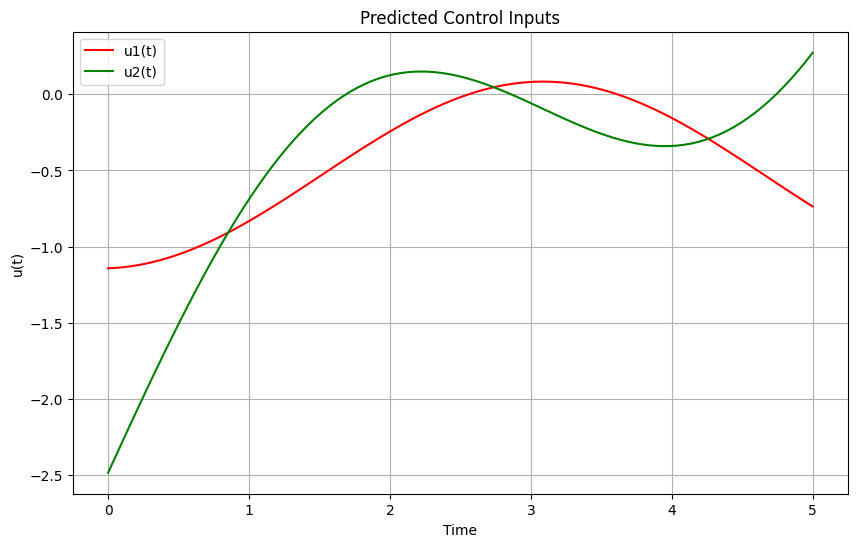

In [22]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.plot(time_points, u_vals[0], label='u1(t)', color='r')
plt.plot(time_points, u_vals[1], label='u2(t)', color='g')
plt.title("Predicted Control Inputs")
plt.xlabel("Time")
plt.ylabel("u(t)")
plt.legend()
plt.grid(True)
plt.show()


The solution of the system using discrete integration of the formula is:
State at t=5.00: [ 1.49248303e-06 -1.74411945e-06 -1.23887516e-06 -3.05142828e-06]


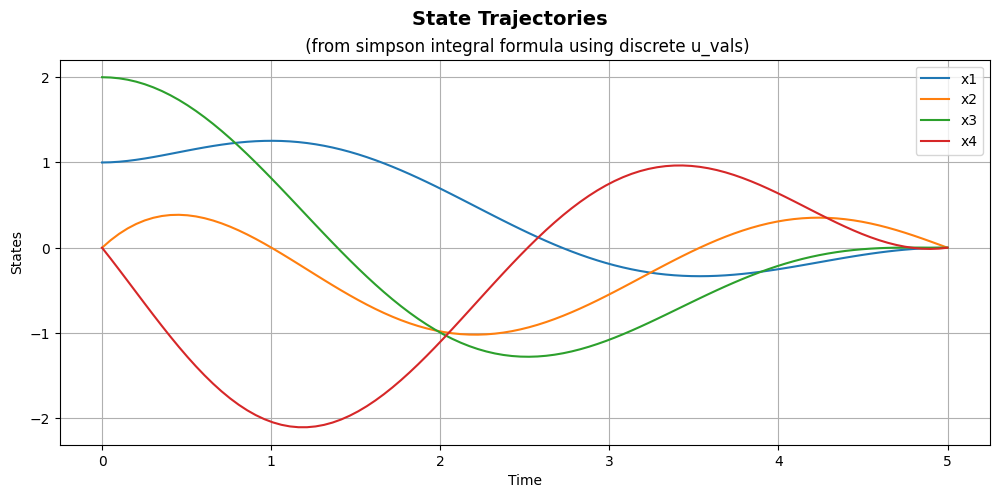

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import expm # For matrix exponential
from scipy.integrate import simpson # For numerical integration using Simpson's rule

n = A.shape[0] # State dimension
m = B.shape[1]

# Initialize the state trajectory array
x_trajectory_discrete_int = np.zeros((len(time_points), n))

# The initial state is x(0) = x0
x_trajectory_discrete_int[0, :] = x0

# Iterate through the time points to compute x(t) at each point
for i, t in enumerate(time_points):
    if i == 0:
        continue # Already set the initial state

    # Select the time points up to the current time t (inclusive) and the corresponding u_pred values
    time_points_subset = time_points[:i+1]
    u_vals_subset = u_vals[:, :i+1] # u_pred shape is (m, N)

    # Calculate the first part: exp(A*t) * x0
    exp_At = expm(A * t)
    x_part1 = exp_At @ x0

    # Calculate the integrand values at the discrete time points in the subset [0, t]
    # The integrand is F(s) = exp(A*(t-s)) @ B @ u(s)
    # F(s) is a vector of shape (n,)
    integrand_values = np.zeros((n, len(time_points_subset)))

    for k, s in enumerate(time_points_subset):
        exp_A_ts = expm(A * (t - s))
        u_s = u_vals_subset[:, k].reshape(-1, 1) # u at time s, reshaped to column vector
        integrand_values[:, k] = (exp_A_ts @ B @ u_s).flatten()

    # Numerically integrate the integrand values from 0 to t using Simpson's rule
    # Integrate each component of the vector integrand separately
    integral_result = np.zeros(n)
    for j in range(n): # Integrate for each state variable component
        # integrand_values[j, :] contains the values of the j-th component of the integrand at time_points_subset
        integral_result[j] = simpson(integrand_values[j, :], time_points_subset)

    # The state x(t) is the sum of the two parts
    x_trajectory_discrete_int[i, :] = x_part1 + integral_result

print("The solution of the system using discrete integration of the formula is:")
# Print the trajectory at the final time point as an example
print(f"State at t={time_points[-1]:.2f}: {x_trajectory_discrete_int[-1]}")

z = time_points

# x_trajectory_discrete_int has shape (N, n), so I slice columns for each state
xt1 = x_trajectory_discrete_int[:, 0]
xt2 = x_trajectory_discrete_int[:, 1]
xt3 = x_trajectory_discrete_int[:, 2]
xt4 = x_trajectory_discrete_int[:, 3]


plt.figure(figsize=(12, 5))
plt.plot(z, xt1, label='x1')
plt.plot(z, xt2, label='x2')
plt.plot(z, xt3, label='x3')
plt.plot(z, xt4, label='x4')
plt.suptitle("State Trajectories",fontsize=14,fontweight='bold')
plt.title(" (from simpson integral formula using discrete u_vals)")
plt.xlabel("Time")
plt.ylabel("States")
plt.legend()
plt.grid(True)
plt.show()

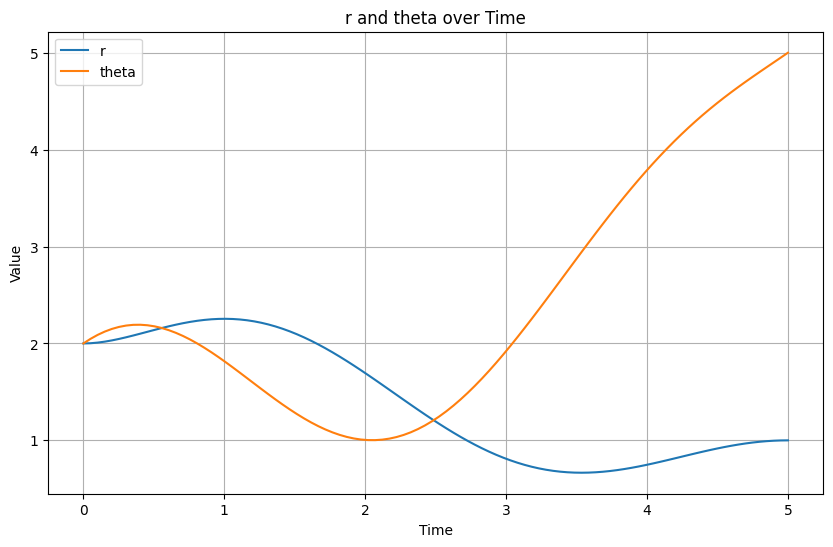

In [5]:
# Calculate theta from x3 = sigma * (theta - omega * t)
# theta = x3/sigma + omega * t
theta_vals = x_trajectory_discrete_int[:, 2] / sigma + omega * time_points

# Calculate r from x1 = r - sigma
# r = x1 + sigma
r_vals = x_trajectory_discrete_int[:, 0] + sigma

# Plot r and theta against time
plt.figure(figsize=(10, 6))
plt.plot(time_points, r_vals, label='r')
plt.plot(time_points, theta_vals, label='theta')
plt.title("r and theta over Time")
plt.xlabel("Time")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

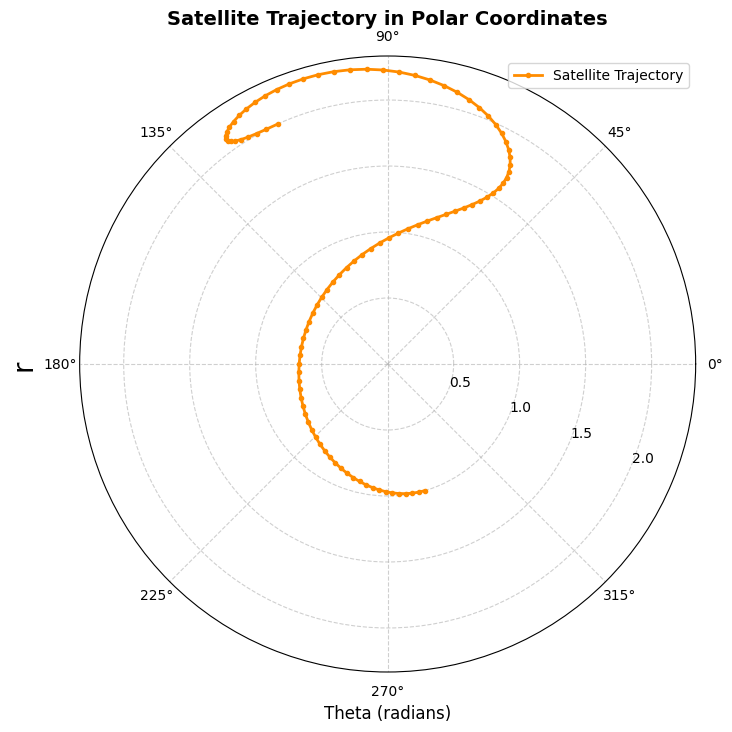

In [6]:
# Create a polar plot
plt.figure(figsize=(8, 8))
ax = plt.subplot(111, projection='polar')

# Plotting of the trajectory in polar coordinates with visual enhancements
ax.plot(theta_vals, r_vals, color='darkorange', linestyle='-', linewidth=2, marker='o', markersize=3, label='Satellite Trajectory')

ax.set_title("Satellite Trajectory in Polar Coordinates", va='bottom', fontsize=14, fontweight='bold', pad=20)
ax.set_xlabel("Theta (radians)", fontsize=12)
ax.set_ylabel("r", fontsize=20, labelpad=30)

ax.set_rlabel_position(-22.5)  # Move radial labels away from plotted line
ax.grid(True, linestyle='--', alpha=0.6)
ax.legend(loc='upper right')

plt.show()

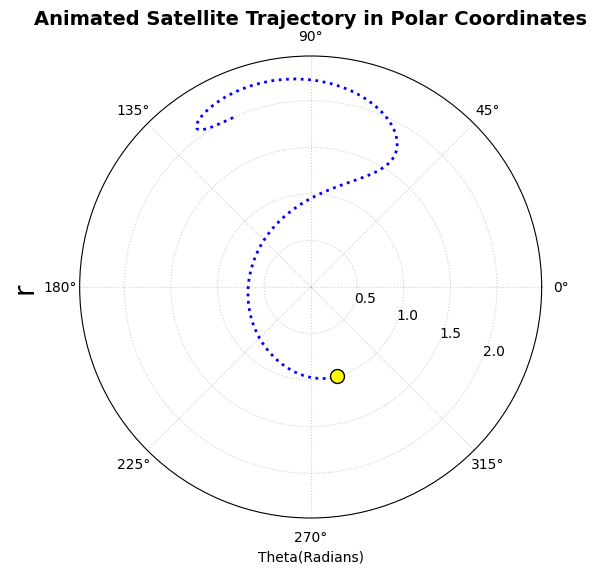

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Set up the figure and axis for polar plot
fig, ax = plt.subplots(figsize=(6, 6), subplot_kw={'projection': 'polar'})
ax.set_title("Animated Satellite Trajectory in Polar Coordinates", va='bottom', fontsize=14, fontweight='bold', pad=20)
ax.set_rlabel_position(-22.5)
ax.grid(True, linestyle=':', alpha=0.6)
ax.set_xlabel("Theta(Radians)")
ax.set_ylabel("r",labelpad=30,fontsize=20)
ax.set_ylim(0, np.max(r_vals) * 1.1)

# Initialize the plot line
line, = ax.plot([], [], color='blue', linestyle=':', linewidth=2, label='Trajectory')

# Initialize the satellite marker
satellite_marker, = ax.plot([], [], 'o', color='yellow', markersize=10, markeredgecolor='black', label='Satellite')

def init():
    line.set_data([], [])
    satellite_marker.set_data([], [])
    return line, satellite_marker

def update(frame):
    # Plot full trajectory up to current point
    line.set_data(theta_vals[:frame+1], r_vals[:frame+1])
    # Update satellite position
    satellite_marker.set_data([theta_vals[frame]], [r_vals[frame]])
    return line, satellite_marker

# Animate
ani = FuncAnimation(fig, update, frames=len(time_points), init_func=init, blit=True)

# Display in Google Colab
from IPython.display import HTML
HTML(ani.to_jshtml())


# Task-2
Implement the RK4 method using interpolation for the control input to solve the ODE dx/dt = Ax + Bu, where A and B are given matrices and u is a time-varying control input. Compare the results with the discrete integration method and visualize the state trajectories. Use the provided `u_vals` and `time_points` for the control input interpolation.

## Define the ode function

### Subtask:
Create a Python function that represents the state-space equation `dx/dt = Ax + Bu`.


**Reasoning**:
The subtask requires defining a function that implements the state-space equation. I will create the `ode_system` function.



In [9]:
def ode_system(t, x, u_interp):
    """
    Represents the state-space equation dx/dt = Ax + Bu.

    Args:
        t (float): Current time.
        x (np.ndarray): Current state vector (n,).
        u_interp (callable): Interpolation function for the control input u(t).
                             Takes time 't' as input and returns the control vector (m,).

    Returns:
        np.ndarray: The derivative of the state vector dx/dt (n,).
    """
    # Get the control input at the current time t using the interpolation function
    u_t = u_interp(t)

    # Compute the derivative of the state vector: dx/dt = Ax + Bu
    dx_dt = A @ x + B @ u_t

    return dx_dt

## Interpolate control input

### Subtask:
Create an interpolation function for `u(t)` using the pre-calculated `u_vals` and `time_points`.


In [10]:
from scipy.interpolate import interp1d

# Create separate interpolators for each control input component
u1_interp = interp1d(time_points, u_vals[0, :], kind='linear')
u2_interp = interp1d(time_points, u_vals[1, :], kind='linear')

def u_interp(t):
    """
    Interpolates the control input u(t) at time t.

    Args:
        t (float): Time at which to interpolate the control input.

    Returns:
        np.ndarray: Interpolated control input vector (m,) at time t.
    """
    # Interpolate each component and combine into a vector
    return np.array([u1_interp(t), u2_interp(t)])

# Test the interpolation function (optional)
# test_time = 2.5
# interpolated_u = u_interp(test_time)
# print(f"Interpolated u at t={test_time}: {interpolated_u}")

## Solve ode with rk4


In [11]:
from scipy.integrate import solve_ivp

# Time span for the integration
t_span = (time_points[0], time_points[-1])

# Solve the ODE using solve_ivp with 'RK45' method and interpolated control
# Pass u_interp as args to the ode_system function
sol = solve_ivp(ode_system, t_span, x0, method='RK45', t_eval=time_points, args=(u_interp,))

# Extract the state trajectory (transpose to get shape (N, n))
x_trajectory_rk45 = sol.y.T

print("The solution of the system using solve_ivp with RK45 is:")
print(f"State at t={time_points[-1]:.2f}: {x_trajectory_rk45[-1]}")


The solution of the system using solve_ivp with RK45 is:
State at t=5.00: [-0.00175964  0.00082252  0.00734784  0.00338637]


## Compare and visualize results


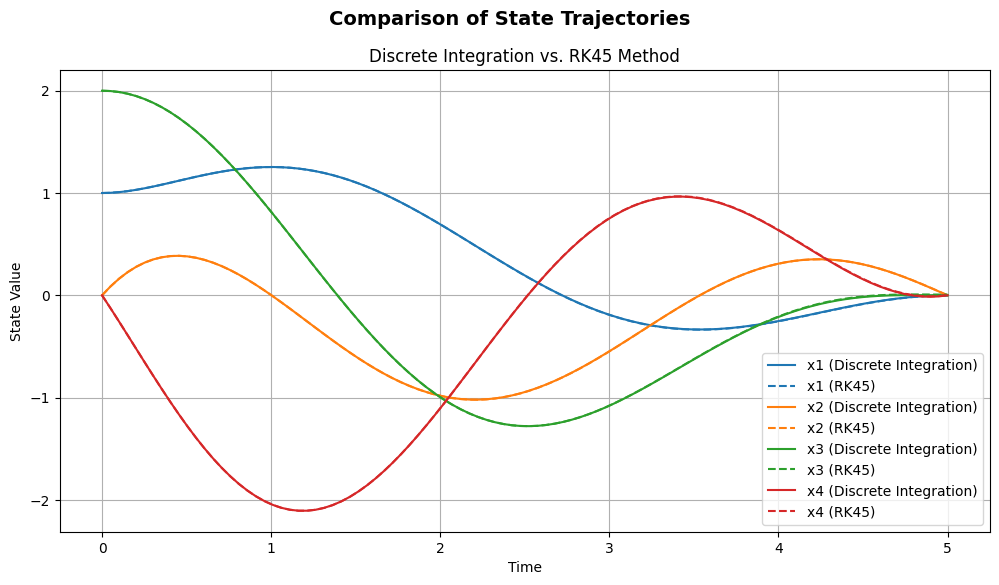

In [17]:
plt.figure(figsize=(12, 6))

# Plot each state variable from both methods
for i in range(n):
    plt.plot(time_points, x_trajectory_discrete_int[:, i], label=f'x{i+1} (Discrete Integration)', linestyle='-', color=f'C{i}')
    plt.plot(time_points, x_trajectory_rk45[:, i], label=f'x{i+1} (RK45)', linestyle='--', color=f'C{i}')

plt.suptitle("Comparison of State Trajectories", fontsize=14, fontweight='bold')
plt.title("Discrete Integration vs. RK45 Method")
plt.xlabel("Time")
plt.ylabel("State Value")
plt.legend()
plt.grid(True)
plt.show()

In [8]:
# import numpy as np
# import matplotlib.pyplot as plt
# from matplotlib.animation import FuncAnimation
# import matplotlib.patches as patches

# # Setup parameters
# sigma = 1.0               # radius of circular orbit
# omega = 1.0               # angular speed
# T = 1.0                    # total time (using the same T as in the simulation)
# frames = 100              # number of frames in animation (matching the number of time points)

# # Compute satellite positions from the simulated trajectory
# # x_trajectory_discrete_int has shape (N, n)
# # x1 = r - theta
# # x3 = sigma * (theta - omega * t)
# # We need the actual x and y coordinates for plotting
# # r_actual = x1 + theta  (where theta is the actual angle from the origin)
# # theta_actual = x3/sigma + omega * t
# # x = r_actual * np.cos(theta_actual)
# # y = r_actual * np.sin(theta_actual)

# # Calculate theta_actual and r_actual from the state trajectory
# theta_actual_vals = x_trajectory_discrete_int[:, 2] / sigma + omega * time_points
# r_actual_vals = x_trajectory_discrete_int[:, 0] + theta_actual_vals # Note: In the previous code, r was calculated as x1 + theta. This is consistent with the state definition if we assume the reference theta is omega*t. Let's use this definition for the animation.

# x_pos = r_actual_vals * np.cos(theta_actual_vals)
# y_pos = r_actual_vals * np.sin(theta_actual_vals)


# # Tangential and radial unit vectors (re-using the functions)
# def radial_vector(theta):
#     return np.array([np.cos(theta), np.sin(theta)])

# def tangential_vector(theta):
#     return np.array([-np.sin(theta), np.cos(theta)])

# # Set up the figure and axis
# fig, ax = plt.subplots(figsize=(6, 6))
# ax.set_aspect('equal')
# # Determine appropriate limits based on the trajectory
# max_range = max(np.max(np.abs(x_pos)), np.max(np.abs(y_pos))) * 1.2
# ax.set_xlim(-max_range, max_range)
# ax.set_ylim(-max_range, max_range)
# ax.set_title("Satellite Trajectory Animation with Thrust Vectors")
# ax.set_xlabel("x")
# ax.set_ylabel("y")
# ax.grid(True)

# # Draw reference orbit and additional circles
# orbit = plt.Circle((0, 0), sigma, color='black', fill=False, linestyle='--', label=f'Orbit (r={sigma})')
# ax.add_patch(orbit)

# # Add circles with different radii
# radii = [0.5, 1.5, 2.0] # Example radii for additional circles
# colors = ['blue', 'purple', 'brown'] # Colors for the new circles
# linestyles = ['--', '--', '--']

# for r, color, ls in zip(radii, colors, linestyles):
#     circle = plt.Circle((0, 0), r, color=color, fill=False, linestyle=ls, label=f'Reference (r={r})')
#     ax.add_patch(circle)


# # Initialize satellite, thrust arrows
# satellite_dot, = ax.plot([], [], 'ko', markersize=5)
# # u1_arrow = ax.arrow(0, 0, 0, 0, head_width=0.05, head_length=0.05, color='r')
# # u2_arrow = ax.arrow(0, 0, 0, 0, head_width=0.05, head_length=0.05, color='g')
# arrows = [] # List to hold arrow patches

# # Add a legend to show what the circles represent
# ax.legend(loc='upper right')


# def init():
#     satellite_dot.set_data([], [])
#     # for arrow in arrows:
#     #     arrow.remove()
#     # arrows.clear()
#     return satellite_dot, #+ arrows

# def update(frame):
#     x, y = x_pos[frame], y_pos[frame]
#     satellite_dot.set_data([x], [y]) # Pass x and y as lists

#     # Remove old arrows
#     for arrow in arrows:
#         arrow.remove()
#     arrows.clear()

#     # Draw new thrust arrows at the satellite's current position
#     # We need the thrust values u_vals at this specific time point
#     # u_vals has shape (m, N), so u_vals[:, frame] gives the thrust vector at this frame's time
#     current_u = u_vals[:, frame] # shape (m,)

#     # The thrust directions are along the instantaneous radial and tangential vectors
#     # The instantaneous angle for the radial and tangential directions is theta_actual_vals[frame]
#     current_theta_actual = theta_actual_vals[frame]
#     radial_dir = radial_vector(current_theta_actual)
#     tangential_dir = tangential_vector(current_theta_actual)

#     # The thrust components current_u[0] and current_u[1] are in the radial and tangential directions, respectively
#     u1_vec = current_u[0] * radial_dir
#     u2_vec = current_u[1] * tangential_dir

#     # Scale the arrows for better visualization (adjust scale as needed)
#     arrow_scale = 0.1

#     arrow1 = ax.arrow(x, y, u1_vec[0] * arrow_scale, u1_vec[1] * arrow_scale,
#                       head_width=0.05, head_length=0.05, fc='r', ec='r', label='u1 (Radial)')
#     arrow2 = ax.arrow(x, y, u2_vec[0] * arrow_scale, u2_vec[1] * arrow_scale,
#                       head_width=0.05, head_length=0.05, fc='g', ec='g', label='u2 (Tangential)')

#     arrows.extend([arrow1, arrow2])


#     return satellite_dot, #+ arrows

# # Create animation
# ani = FuncAnimation(fig, update, frames=frames, init_func=init, blit=False)

# # For Google Colab
# from IPython.display import HTML
# HTML(ani.to_jshtml())